In [1]:
# Importing libraries
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import PIL
from PIL import Image
from tensorflow.keras import Model

In [ ]:
def gram_matrix(input_tensor):
    """
    Computes the Gram matrix for a given input tensor.

    Args:
    - input_tensor: A 3D tensor representing the feature maps of a convolutional layer.
                   Shape should be (batch_size, height, width, channels).

    Returns:
    - gram_matrix: The Gram matrix, which represents the correlations between different filter responses.
                   Shape is (1, channels, channels) after adding an extra dimension.

    The Gram matrix is computed using the Einstein summation ('bijc, bijd -> bcd') to efficiently
    calculate the dot products of the vectorized feature maps. It is normalized by dividing by the
    total number of elements in the feature maps (height * width), ensuring scale invariance.

    This function is commonly used in neural style transfer to capture style information from the
    feature maps of a convolutional layer.

    References:
    - A Neural Algorithm of Artistic Style (https://arxiv.org/abs/1508.06576)
    """

    # Using Einstein summation to calculate the Gram matrix
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    gram_matrix = tf.expand_dims(result, axis=0)
    input_shape = tf.shape(input_tensor)
    
    # Normalizing the Gram matrix
    i_j = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return gram_matrix / i_j


In [ ]:
def load_vgg():
    """
    Loads a pre-trained VGG19 model and constructs a new model for style transfer.

    Returns:
    - model: A Keras Model that outputs the content representation and Gram matrices
             of the specified layers for style transfer.
    """

    # Load pre-trained VGG19 model without top (fully connected) layers with Keras API
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

    # ---------------If VGG19 weights locally available, uncomment and use the following--------------------

    # vgg = tf.keras.applications.VGG19(include_top=False, weights=None)
    # vgg.load_weights('vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5') #loading the weights

    # ------------------------------------------------------------------------------------------------------

    vgg.trainable = False

    # Define layers for content and style representations
    content_layers = ['block4_conv2']
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

    # Extract output tensors for content and style layers
    content_output = vgg.get_layer(content_layers[0]).output
    style_output = [vgg.get_layer(style_layer).output for style_layer in style_layers]

    # Calculate Gram matrices for style layers
    gram_style_output = [gram_matrix(output_) for output_ in style_output]

    # Create a new model with specified inputs and outputs
    model = Model([vgg.input], [content_output, gram_style_output])

    return model# defining content image path and style image path

In [ ]:
content_path = 'content.jpg'
# content_path = 'temple.JPEG'
style_path = 'van gogh.jpeg'
# style_path = 'style.jpg'
# style_path = 'style2.jpg'
# style_path = 'style3.jpg'

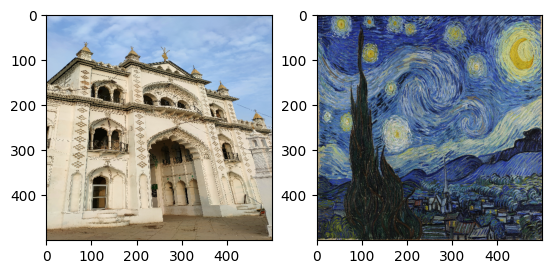

In [78]:
# Display the content and style images side by side using Matplotlib
%matplotlib inline

# Load and preprocess the content image
content_image = cv2.resize(cv2.imread(content_path), (500, 500))
content_image = tf.image.convert_image_dtype(content_image, tf.float32)

# Load and preprocess the style image
style_image = cv2.resize(cv2.imread(style_path), (500, 500))
style_image = tf.image.convert_image_dtype(style_image, tf.float32)

# Plot the content image on the left side
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(np.array(content_image), cv2.COLOR_BGR2RGB))
plt.title('Content Image')
plt.axis('off')  # Turn off axis labels for better visualization

# Plot the style image on the right side
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(np.array(style_image), cv2.COLOR_BGR2RGB))
plt.title('Style Image')
plt.axis('off')  # Turn off axis labels for better visualization

# Display the plot
plt.show()

In [79]:
# Create an Adam optimizer for gradient-based optimization
opt = tf.optimizers.Adam(learning_rate=0.01, beta_1=0.99, epsilon=1e-1)

In [ ]:
def loss_object(style_outputs, content_outputs, style_target, content_target):
    """
    Computes the total loss for style transfer by combining content and style losses.

    Args:
    - style_outputs: List of tensors representing style features at different layers.
    - content_outputs: Tensor representing content features.
    - style_target: List of tensors representing target style features at different layers.
    - content_target: Tensor representing target content features.

    Returns:
    - total_loss: Combined loss consisting of weighted content and style losses.
    """

    # Define weights for content and style losses
    style_weight = 8e-1
    content_weight = 8e-4

    # Compute content loss
    content_loss = tf.reduce_mean((content_outputs - content_target)**2)

    # Compute style loss using mean squared difference for each style layer
    style_loss = tf.add_n([tf.reduce_mean((output_ - target_)**2) for output_, target_ in zip(style_outputs, style_target)])

    # Combine content and style losses with specified weights
    total_loss = content_weight * content_loss + style_weight * style_loss

    return total_loss


In [ ]:
# Load the VGG model for style transfer
vgg_model = load_vgg()

# Preprocess and obtain content representation for the content image
content_target = vgg_model(np.array([content_image * 255]))[0]

# Preprocess and obtain style representations for the style image
style_target = vgg_model(np.array([style_image * 255]))[1]


In [ ]:
def train_step(image, epoch):
    """
    Performs a single training step for style transfer.

    Args:
    - image: The input image tensor to be optimized.
    - epoch: The current epoch number.

    Returns:
    None
    """
    # GradientTape to record operations for automatic differentiation
    with tf.GradientTape() as tape:
        output = vgg_model(image * 255)
        loss = loss_object(output[1], output[0], style_target, content_target)

    # Compute the gradient of the loss with respect to the input image
    gradient = tape.gradient(loss, image)

    # Update the image using the optimizer
    opt.apply_gradients([(gradient, image)])

    # Clip values of the image to be within [0, 1]
    image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0))

    # Display intermediate results every 100 epochs
    if epoch % 100 == 0:
        tf.print(f"Epoch = {epoch}, Loss = {loss}")
        tensor = image * 255
        tensor = np.array(tensor, dtype=np.uint8)

        if np.ndim(tensor) > 3:
            assert tensor.shape[0] == 1
            tensor = tensor[0]

        tensor = PIL.Image.fromarray(tensor)

        # Display the image using Matplotlib
        plt.imshow(cv2.cvtColor(np.array(tensor), cv2.COLOR_BGR2RGB))
        plt.show()


Epoch = 0, Loss = 264895774720.0


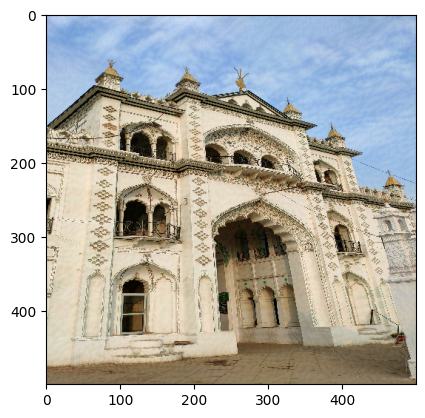

Epoch = 100, Loss = 4133580288.0


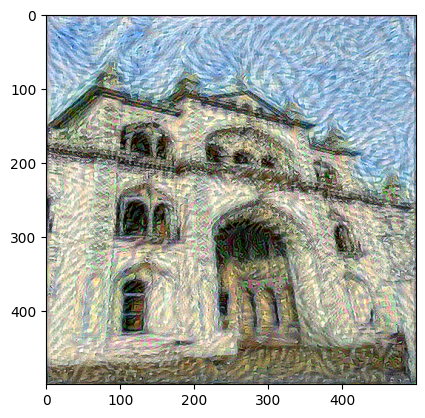

Epoch = 200, Loss = 1546759296.0


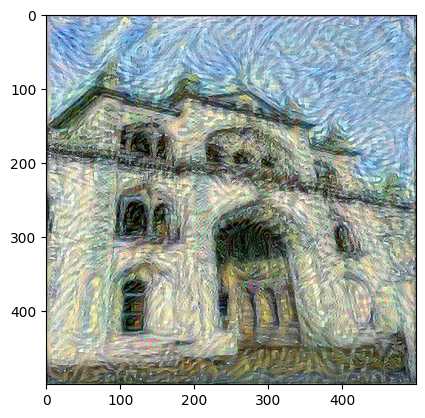

Epoch = 300, Loss = 725940416.0


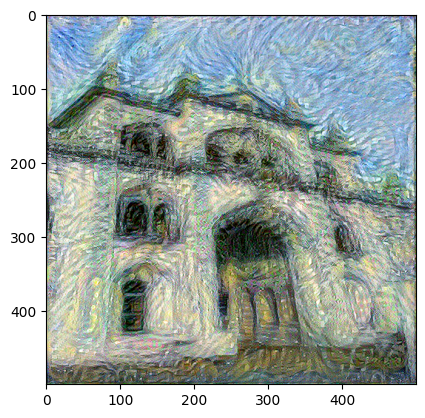

Epoch = 400, Loss = 408669280.0


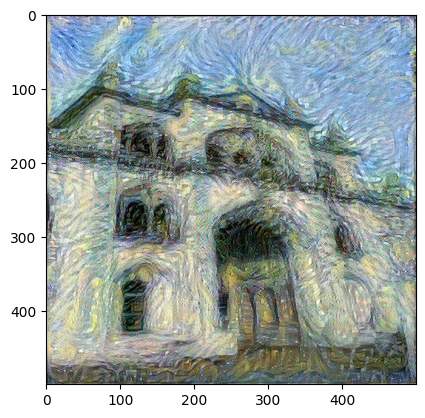

Epoch = 500, Loss = 269250016.0


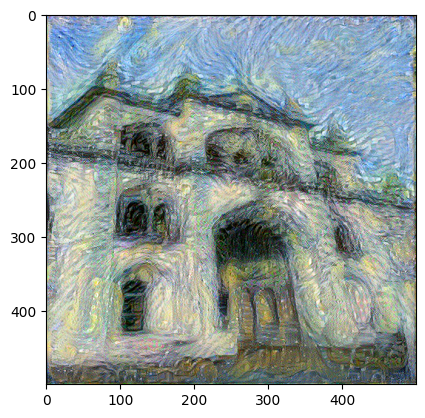

Epoch = 600, Loss = 201194208.0


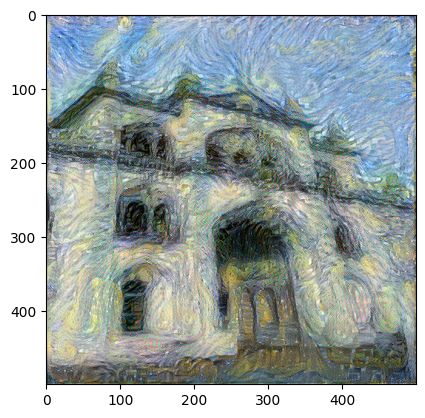

Epoch = 700, Loss = 163539568.0


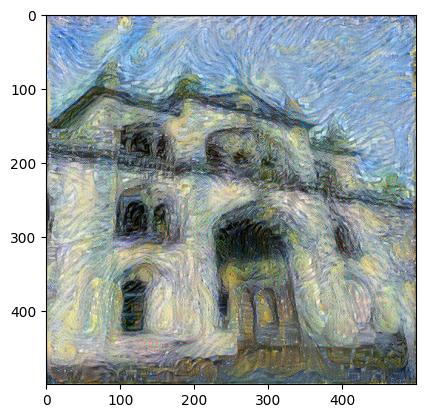

Epoch = 800, Loss = 140405488.0


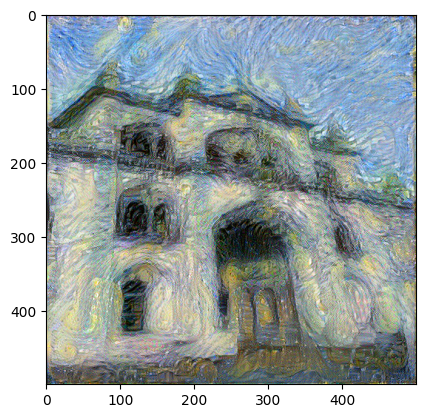

Epoch = 900, Loss = 124627488.0


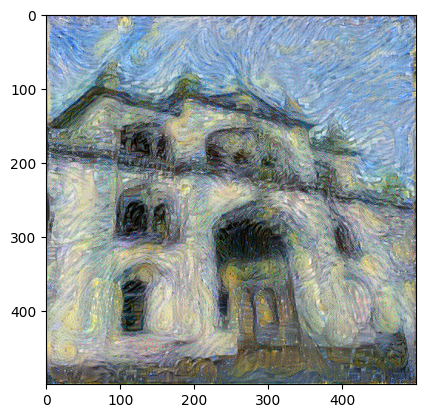

Epoch = 1000, Loss = 112919440.0


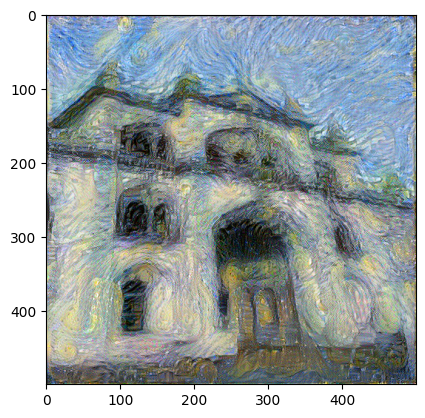

Epoch = 1100, Loss = 103665392.0


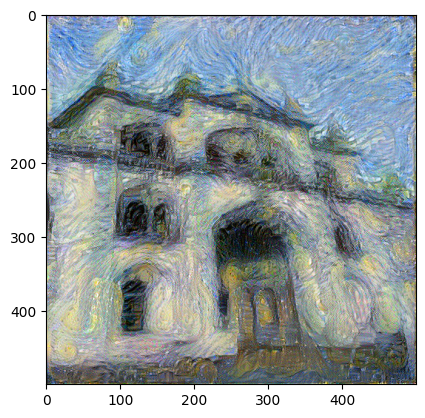

Epoch = 1200, Loss = 96035416.0


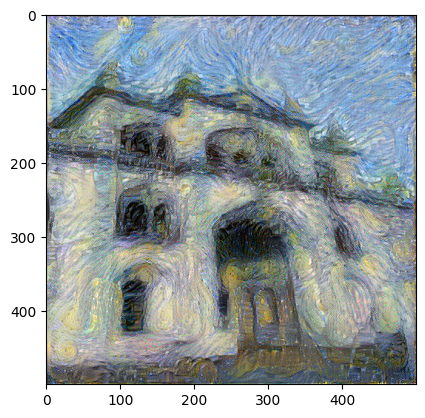

Epoch = 1300, Loss = 89516352.0


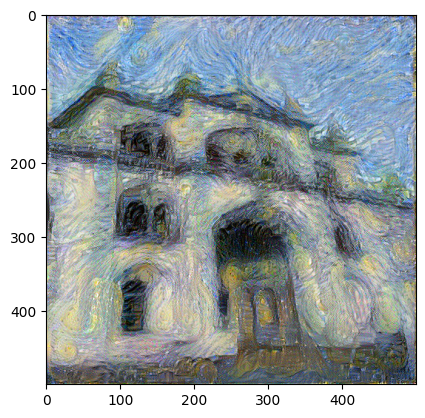

Epoch = 1400, Loss = 83828608.0


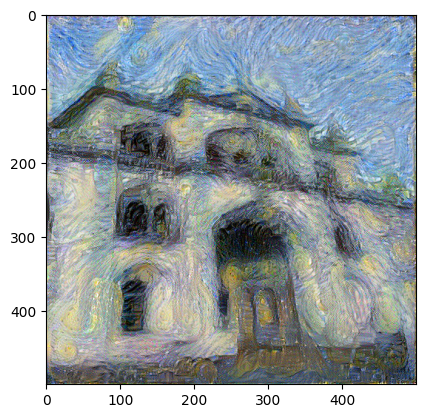

Epoch = 1500, Loss = 78770968.0


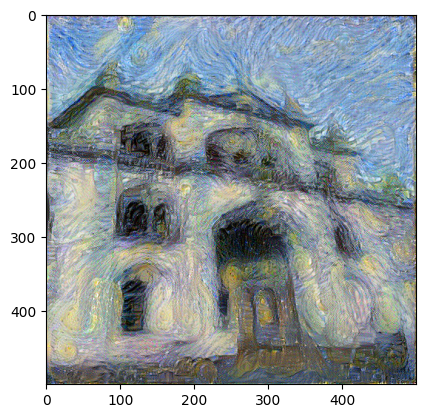

Epoch = 1600, Loss = 74205776.0


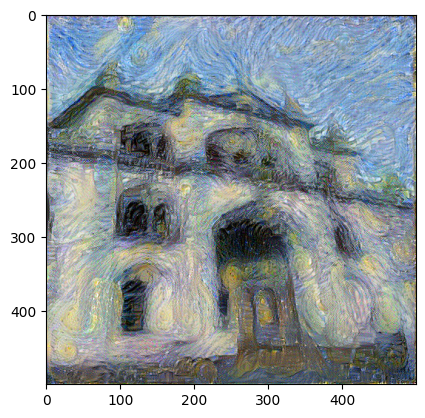

Epoch = 1700, Loss = 70045296.0


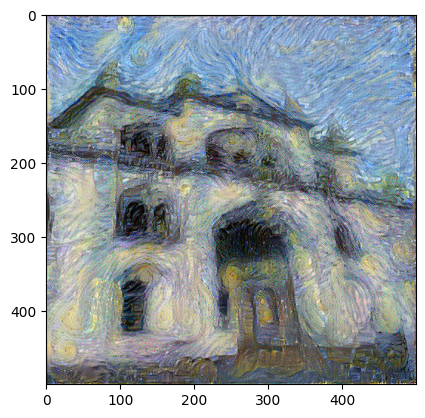

Epoch = 1800, Loss = 66233204.0


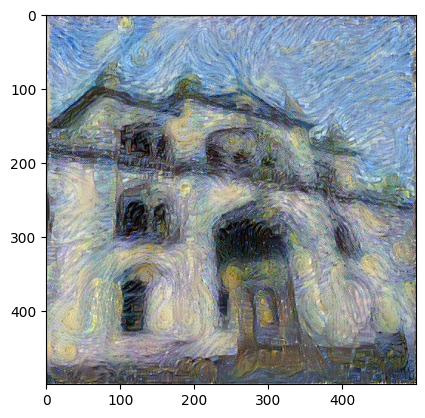

Epoch = 1900, Loss = 62707996.0


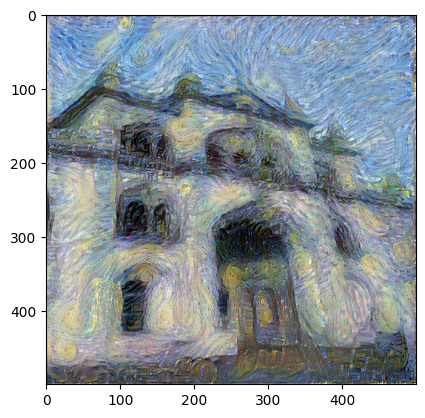

In [83]:
EPOCHS = 2000
image = tf.image.convert_image_dtype(content_image, tf.float32)
image = tf.Variable([image])
for i in range(EPOCHS):
  train_step(image, i)

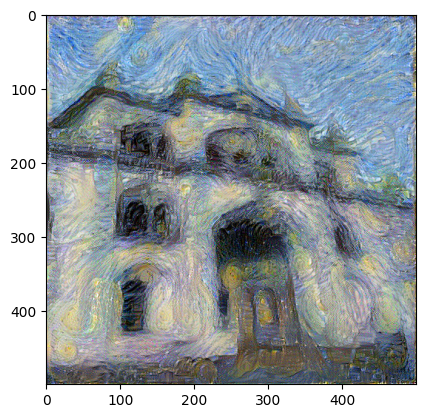

In [85]:
# Display final result

tensor = image*255
tensor = np.array(tensor, dtype=np.uint8)
if np.ndim(tensor)>3:
  assert tensor.shape[0] == 1
  tensor = tensor[0]
# tensor =  PIL.Image.fromarray(tensor)
# tensor.save('/content/tmpl.jpg')
tensor_rgb = cv2.cvtColor(tensor, cv2.COLOR_BGR2RGB)

# Convert the NumPy array to a PIL Image
tensor_pil = Image.fromarray(tensor_rgb)

# Save the image
tensor_pil.save('/content/tmpl.jpg')
plt.imshow(cv2.cvtColor(np.array(tensor), cv2.COLOR_BGR2RGB))
plt.show()